In [8]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
def crop(image):
  # Define as coordenadas do retângulo de recorte (x, y, largura, altura)
  x = 110
  y = 0
  width = 130
  height = 300

  # Recorta a região da imagem
  bottle = image[y:y+height, x:x+width]

  return bottle

In [7]:
def load_images_from_folder(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path):
            image = cv2.imread(file_path)
            if image is not None:
                images.append(image)
    return images

In [11]:
def has_content(image):
  x = 30
  y = 113
  width = 70
  height = 22

  content_region = image[y:y+height, x:x+width]
#   plt.imshow(content_region)
#   plt.show()

  lower_color = np.array([0, 0, 0])  # Limite inferior para preto em RGB
  upper_color = np.array([50, 50, 50])  # Limite superior para preto em RGB

  # Segmentação de cores
  mask = cv2.inRange(content_region, lower_color, upper_color)

  # Verificando se há pixels brancos na máscara
  has_content = np.any(mask == 255)

  if has_content:
      return 1
  else:
      return 0

In [18]:
def has_bottle(image):
    # Convertendo a imagem para escala de cinza
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Definindo a região central para verificar a existência de bordas
    x = int(image.shape[1] / 4)
    y = int(image.shape[0] / 4)
    width = int(image.shape[1] / 2)
    height = int(image.shape[0] / 2)
    central_region = gray[y:y+height, x:x+width]
    # plt.imshow(central_region)
    # plt.show()
    # Aplicando o operador de Canny para detecção de bordas
    edges = cv2.Canny(central_region, 100, 200)

    # Verificando se existem bordas na região central
    has_edges = np.any(edges > 0)

    if not has_edges:
        return 1
    else:
        return 0

In [5]:
def has_cap(image):
  # Definindo as coordenadas da região da tampa
  x = 0
  y = 0
  width = 100
  height = 70

  # Recortando a região da tampa da garrafa
  cap_region = image[y:y+height, x:x+width]
  # plt.imshow(cap_region)

  # Definindo o intervalo de cores da tampa (no exemplo, consideramos uma tampa vermelha)
  lower_color = np.array([100, 0, 0]) 
  upper_color = np.array([255, 50, 50])
  
  # Segmentação de cores
  mask = cv2.inRange(cap_region, lower_color, upper_color)

  # Verificando se há pixels brancos na máscara
  has_red = np.any(mask == 255)

  if has_red:
      return 0
  else:
      return 1

In [4]:
def has_label(image):
  # Definindo as coordenadas da região do rótulo
  x = 20
  y = 175
  width = 150
  height = 150

  # Recortando a região do rótulo
  label_region = image[y:y+height, x:x+width]

  # plt.imshow(label_region)

  # Definindo o intervalo de cores do rótulo (no exemplo, consideramos um rótulo vermelho)
  lower_color = np.array([100, 0, 0])
  upper_color = np.array([255, 50, 50])

  # Segmentação de cores
  mask = cv2.inRange(label_region, lower_color, upper_color)

  # Verificando se há pixels brancos na máscara
  has_red = np.any(mask == 255)

  if has_red:
      return 0
  else:
      return 1

In [53]:
def has_bottle_smashed(image):
    # Definindo as coordenadas da região da garrafa
    x = 0
    y = 0
    width = 100
    height = 200

    # Recortando a região da garrafa
    bottle_region = image[y:y+height, x:x+width]
    plt.imshow(bottle_region)
    plt.show()

    # Convertendo a imagem para escala de cinza
    gray_image = cv2.cvtColor(bottle_region, cv2.COLOR_RGB2GRAY)

    # Aplicando a detecção de bordas
    edges = cv2.Canny(gray_image, 50, 150)

    # Aplicando a transformada de Hough para detectar linhas
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=50, minLineLength=50, maxLineGap=10)

    # Verificando se foram encontradas linhas
    if lines is not None:
        return 0  # Garrafa não amassada
    else:
        return 1  # Garrafa amassada

In [45]:
def has_label_white(image):
    # Definindo as coordenadas da região do rótulo
    x = 20
    y = 170
    width = 130
    height = 70

    # Recortando a região do rótulo
    label_region = image[y:y+height, x:x+width]
    # plt.imshow(label_region)
    # plt.show()
    gray_image = cv2.cvtColor(label_region, cv2.COLOR_RGB2GRAY)
    thresh = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
  
    # Calculando a porcentagem de pixels brancos na imagem
    total_pixels = np.prod(thresh.shape)
    white_pixels = np.sum(thresh == 255)
    white_percentage = (white_pixels / total_pixels) * 100

    has_significant_white_area = white_percentage > 75

    if has_significant_white_area:
        return 1
    else:
        return 0

In [54]:
dic = { 'CONTENT_HIGH': 0, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0 }

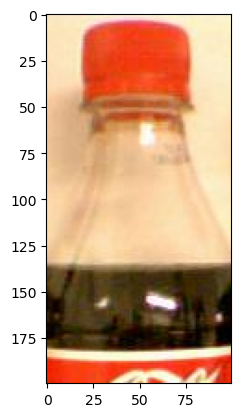

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


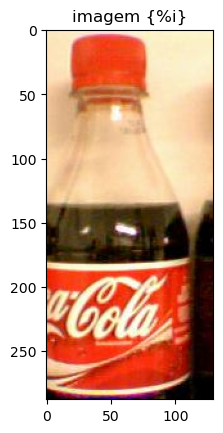

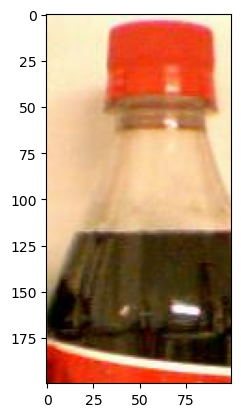

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


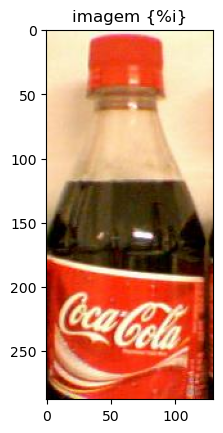

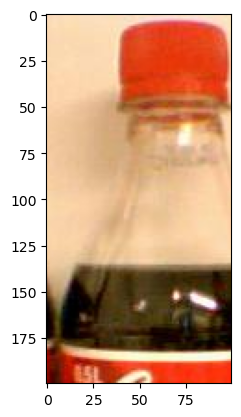

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


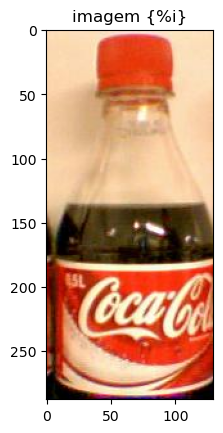

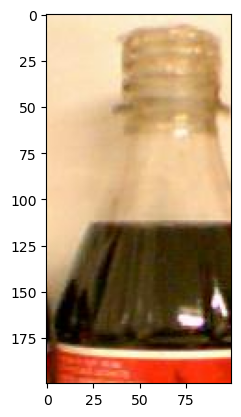

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


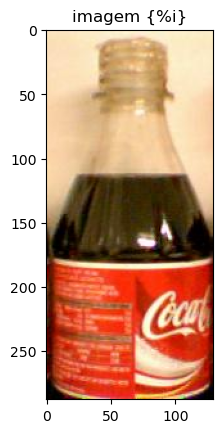

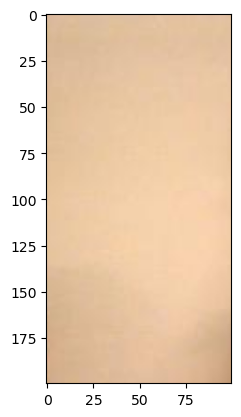

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 1, 'BOTTLE_NONE': 1}


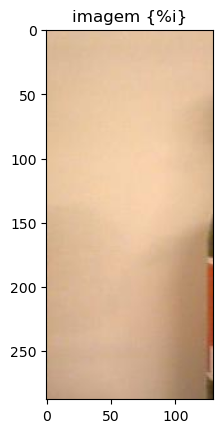

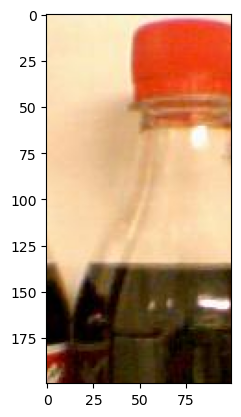

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 1, 'BOTTLE_NONE': 0}


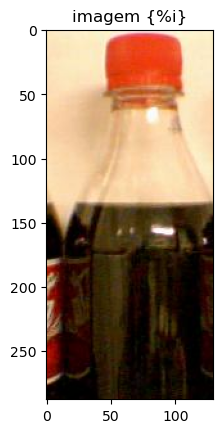

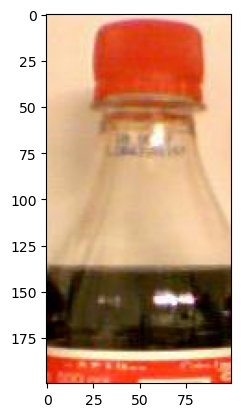

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


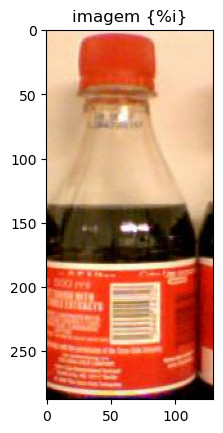

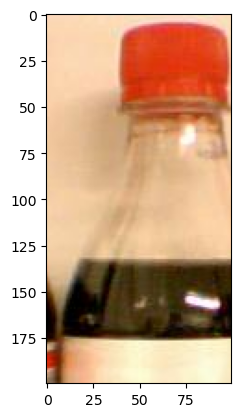

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


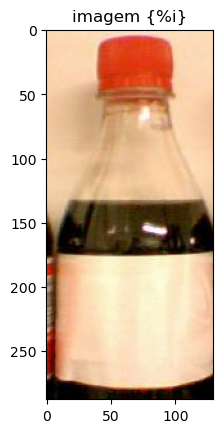

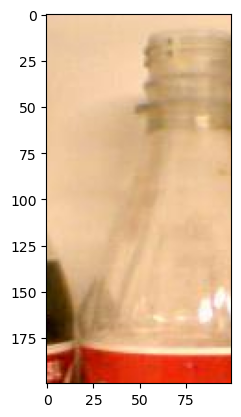

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


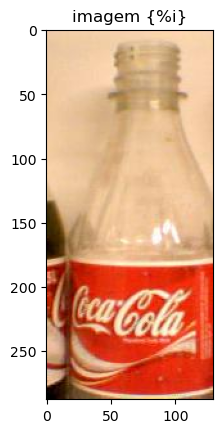

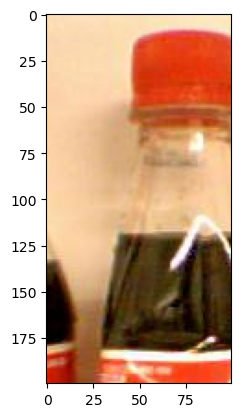

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


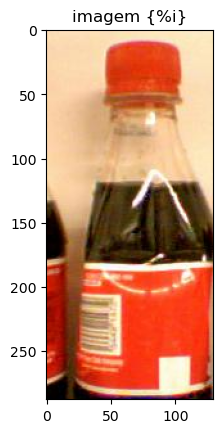

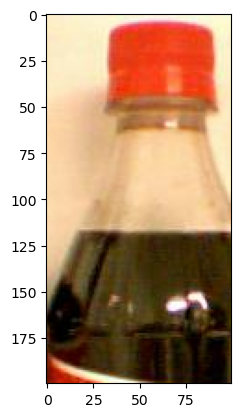

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


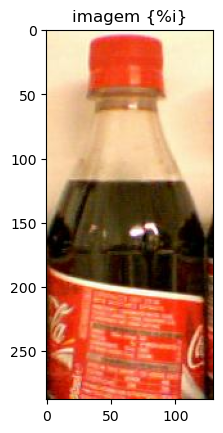

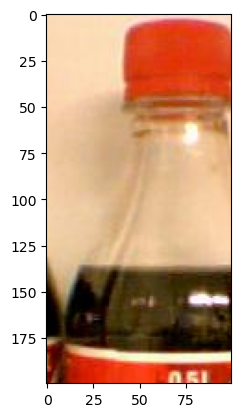

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


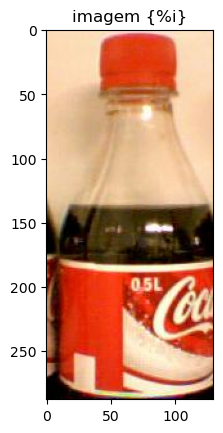

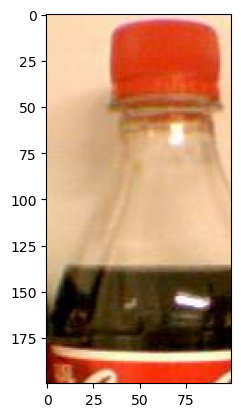

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


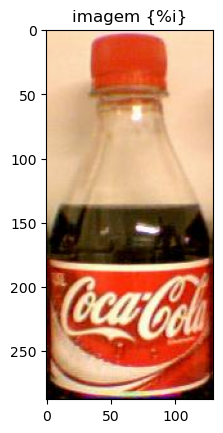

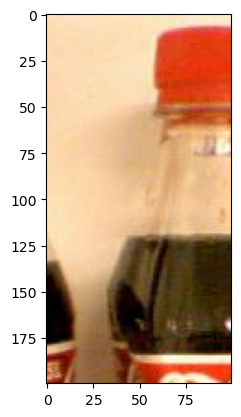

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


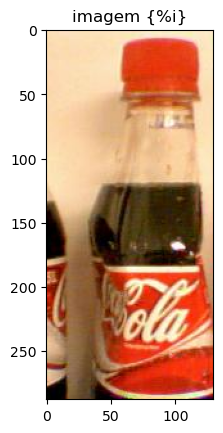

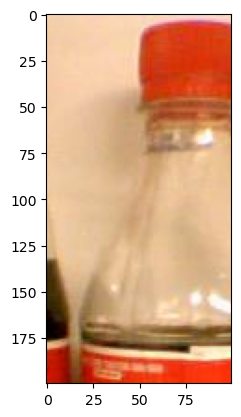

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


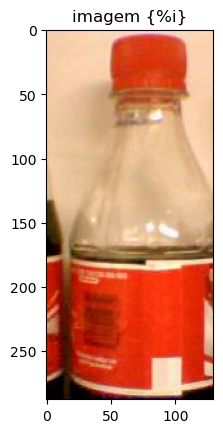

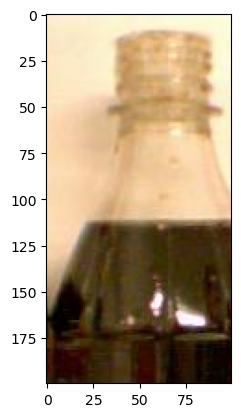

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 1, 'BOTTLE_NONE': 0}


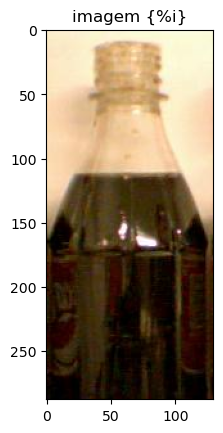

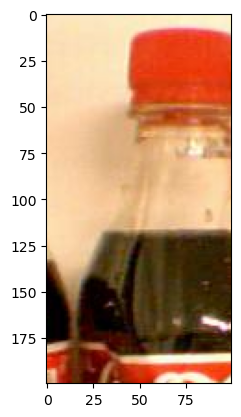

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


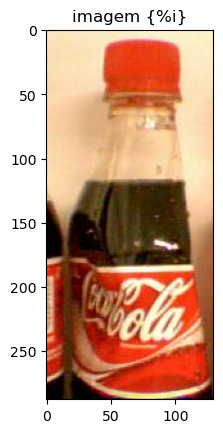

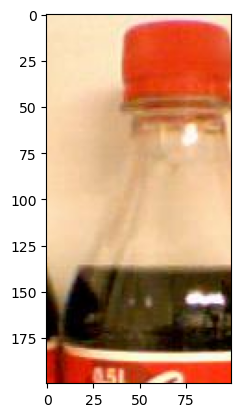

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


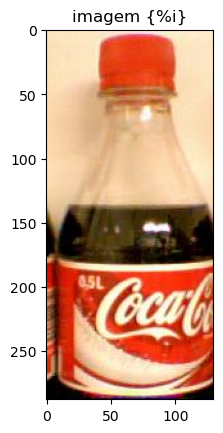

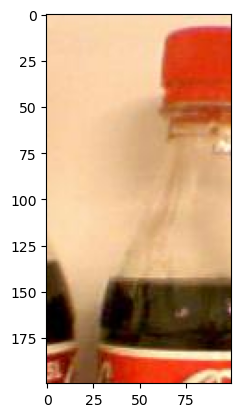

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


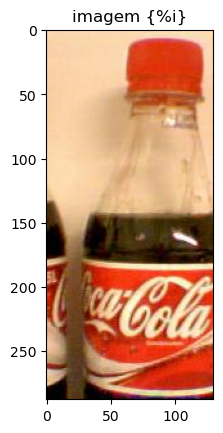

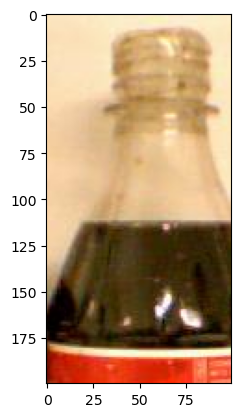

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


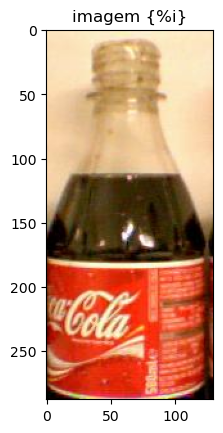

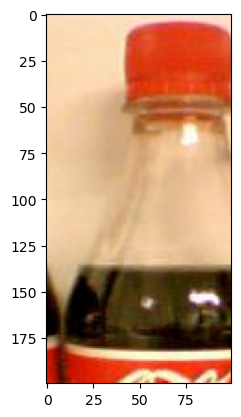

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


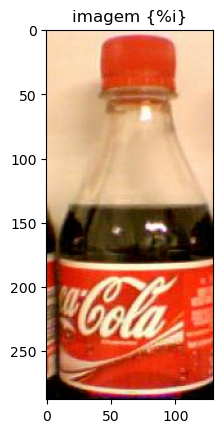

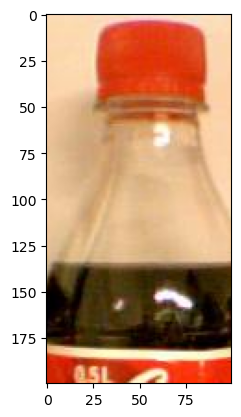

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


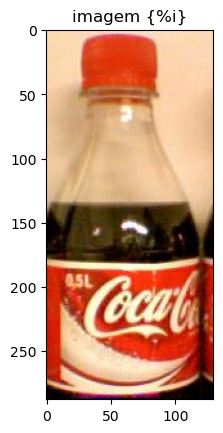

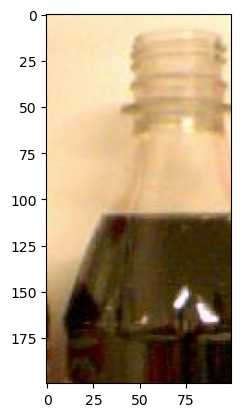

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


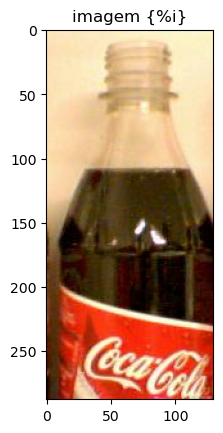

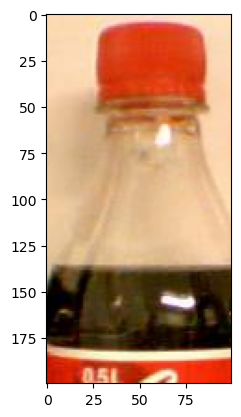

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


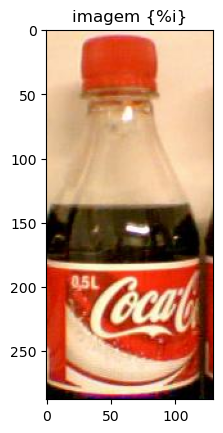

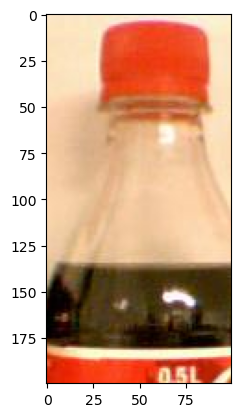

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


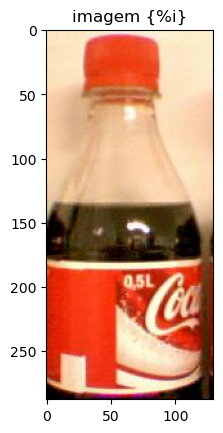

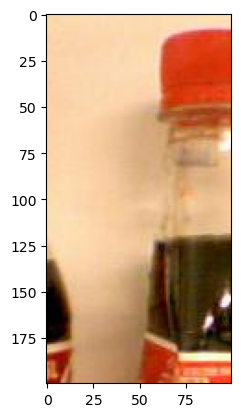

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


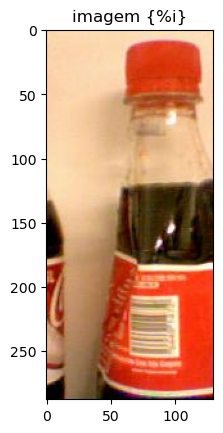

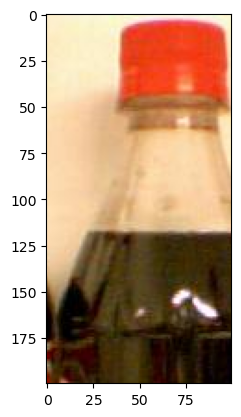

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


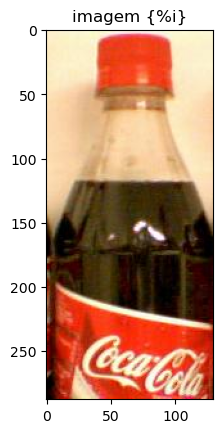

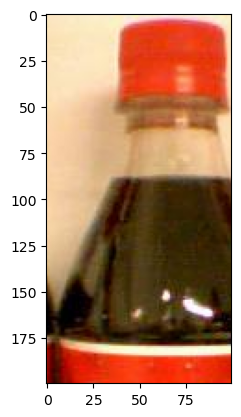

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


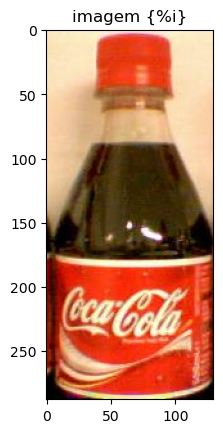

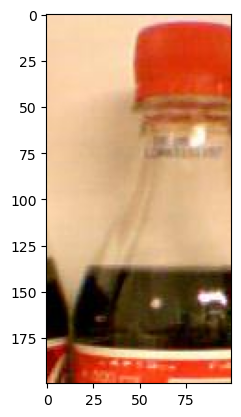

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


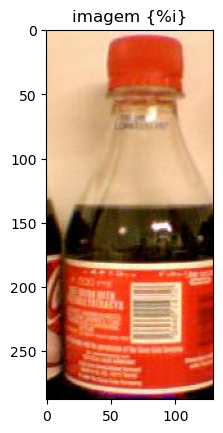

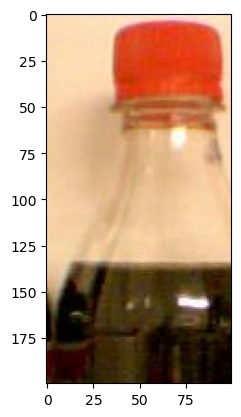

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 1, 'BOTTLE_NONE': 0}


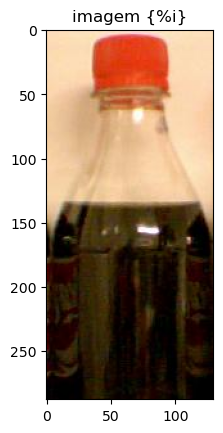

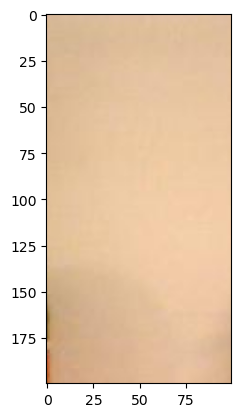

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 1, 'BOTTLE_NONE': 1}


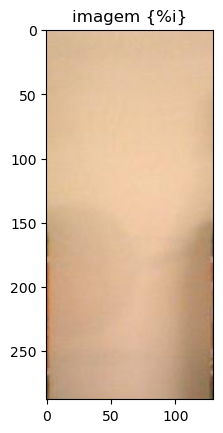

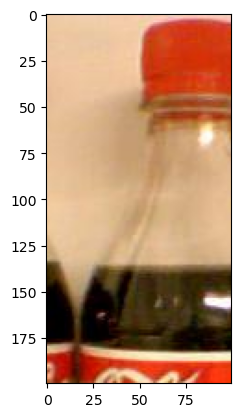

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


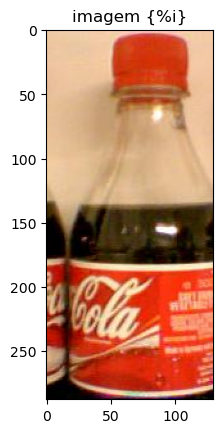

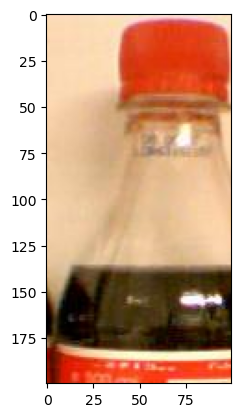

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


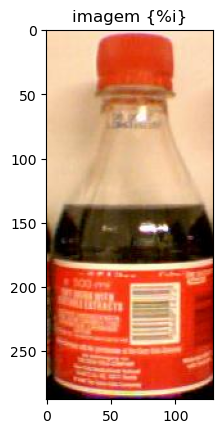

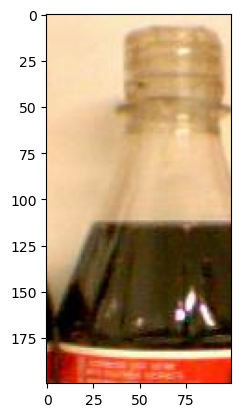

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


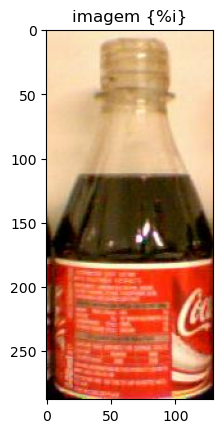

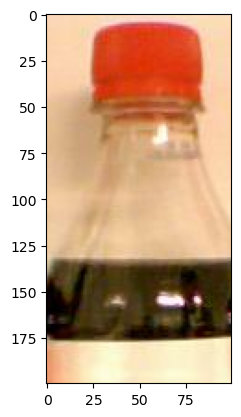

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


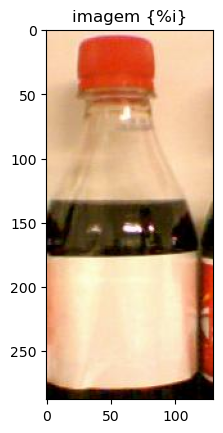

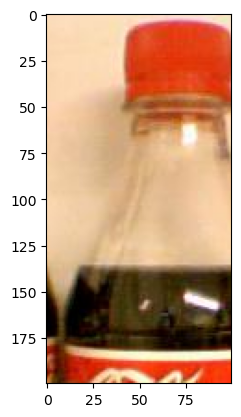

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


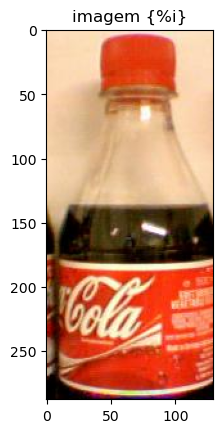

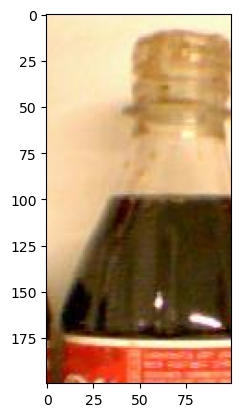

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


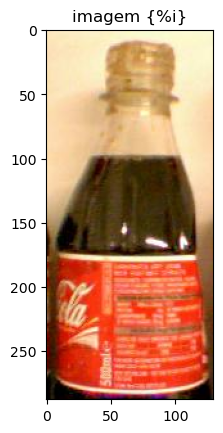

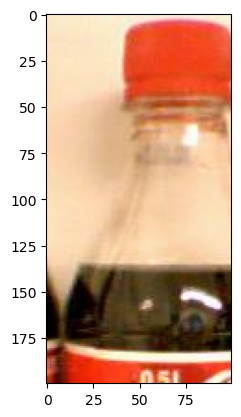

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


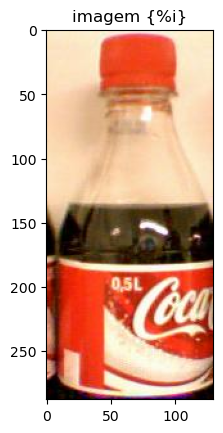

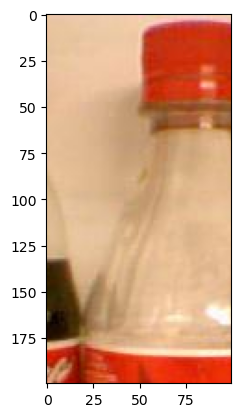

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


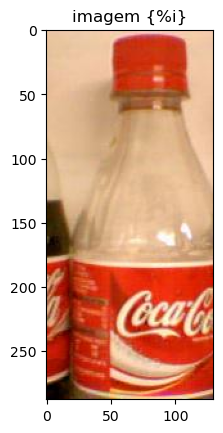

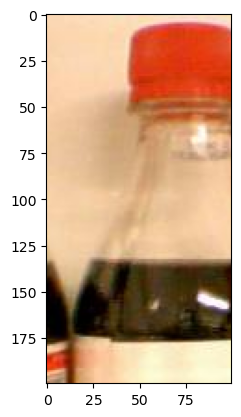

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


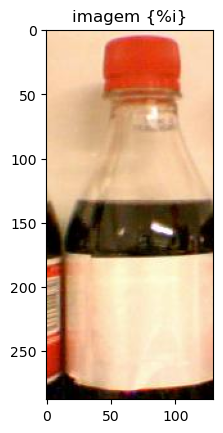

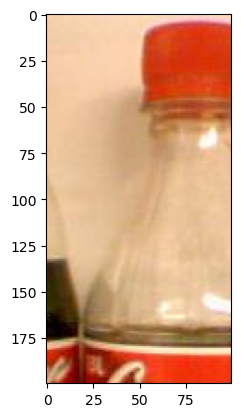

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


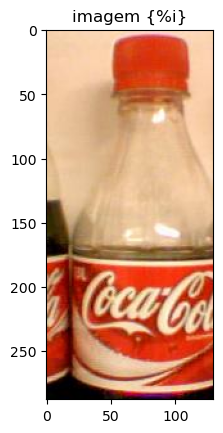

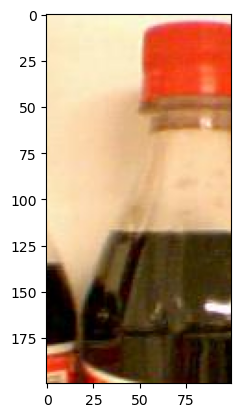

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


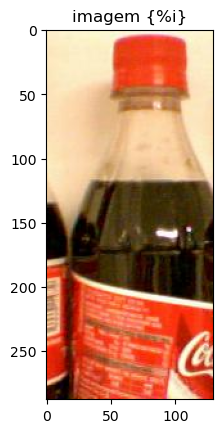

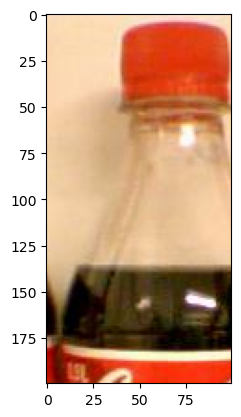

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


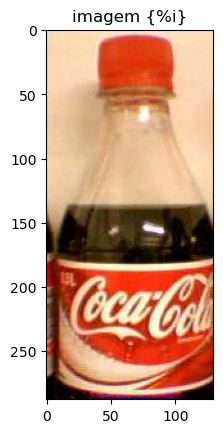

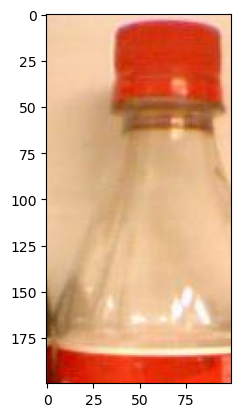

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


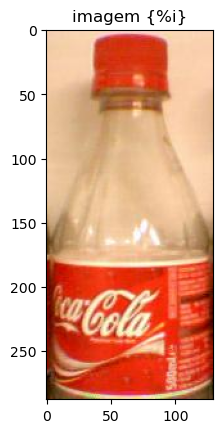

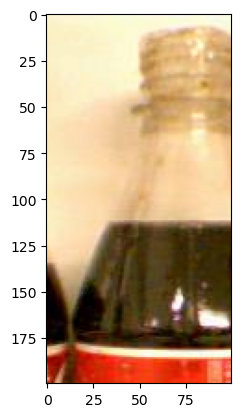

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


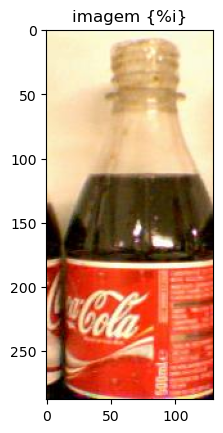

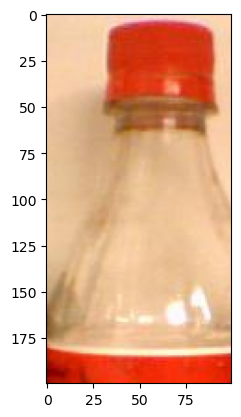

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


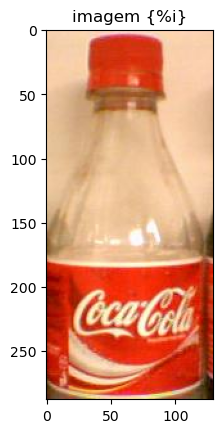

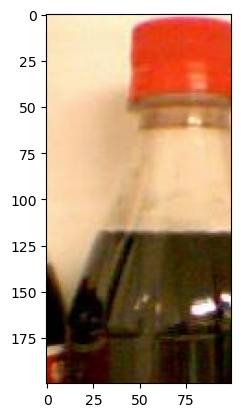

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


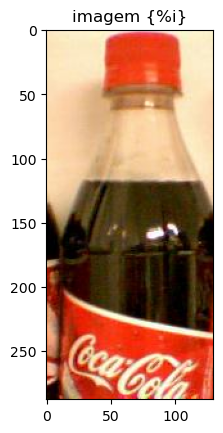

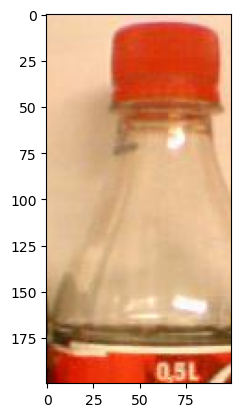

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


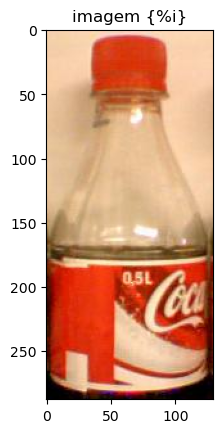

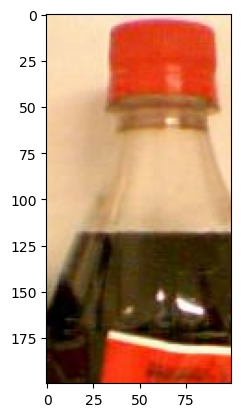

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


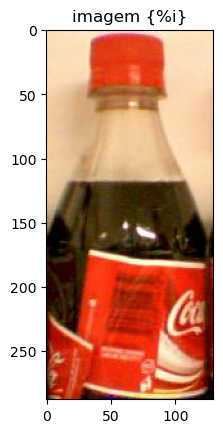

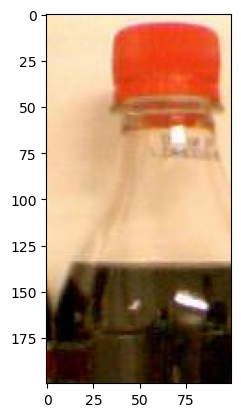

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 1, 'BOTTLE_NONE': 0}


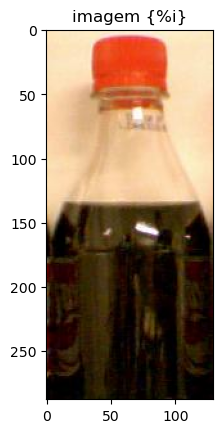

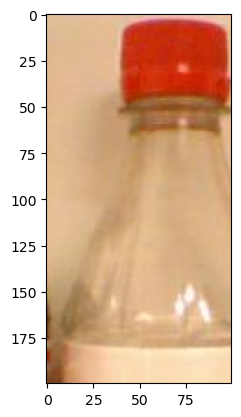

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 1, 'BOTTLE_NONE': 0}


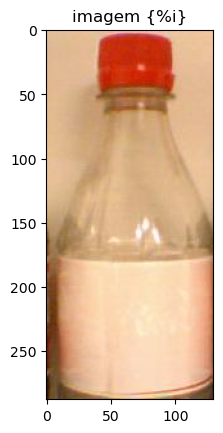

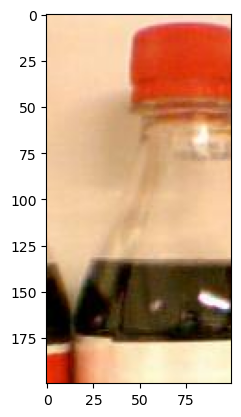

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


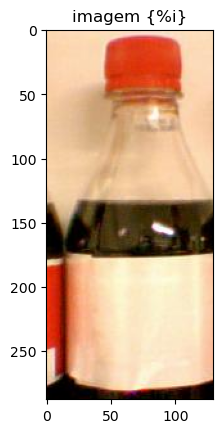

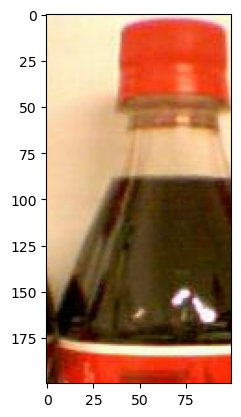

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


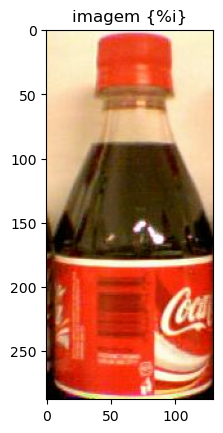

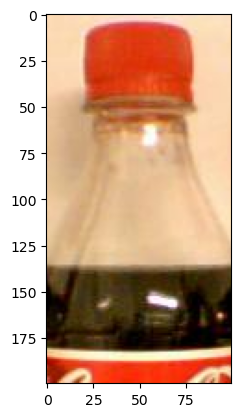

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


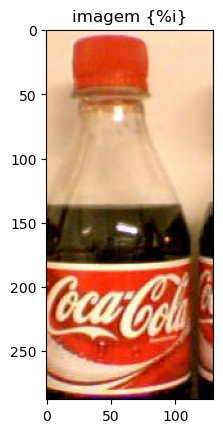

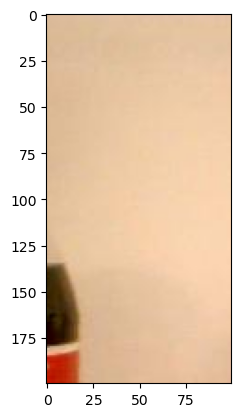

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 1, 'BOTTLE_NONE': 1}


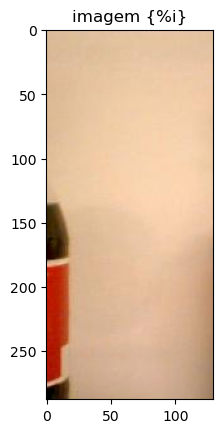

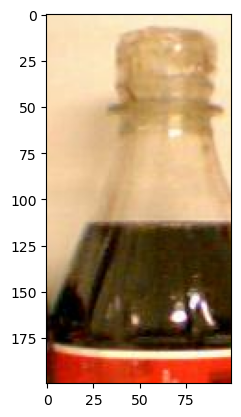

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


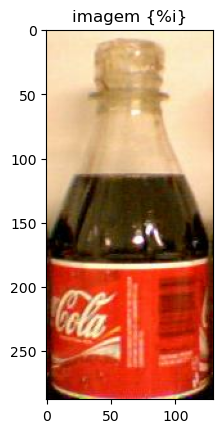

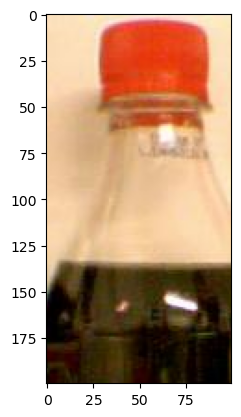

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


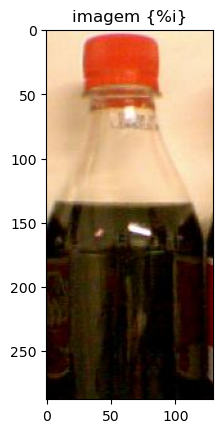

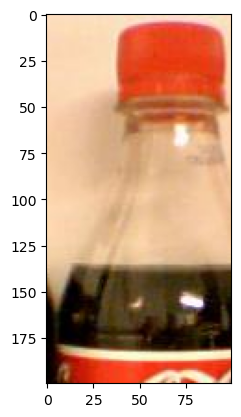

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


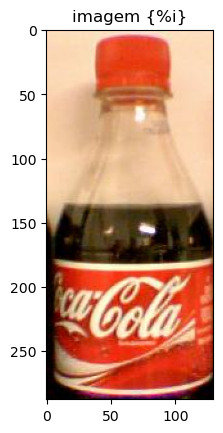

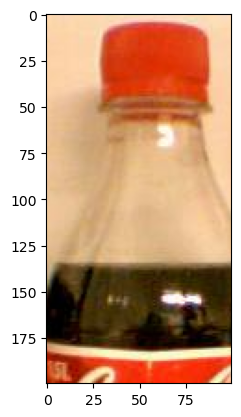

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


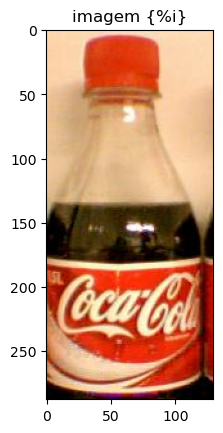

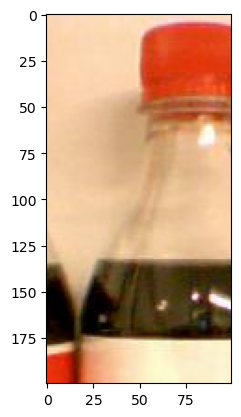

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


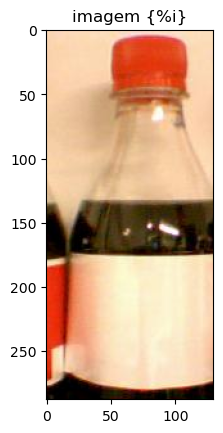

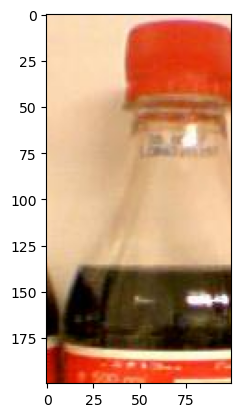

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


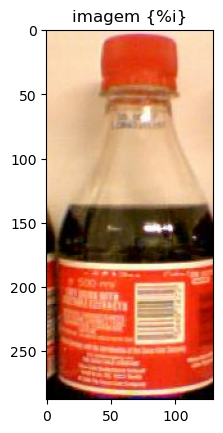

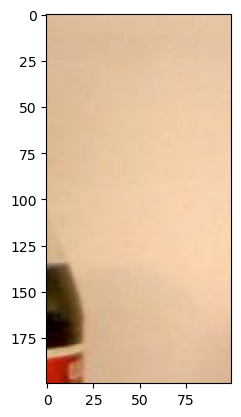

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 1, 'BOTTLE_NONE': 1}


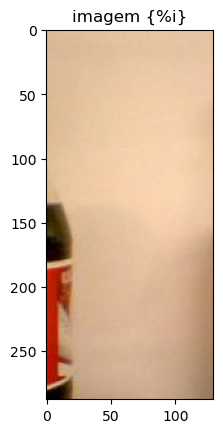

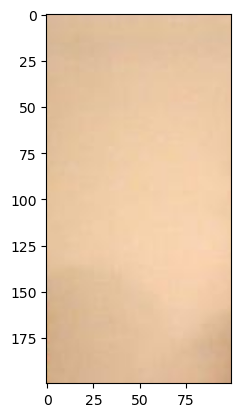

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 1, 'BOTTLE_NONE': 1}


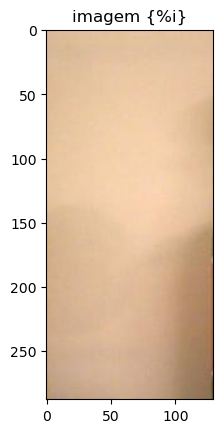

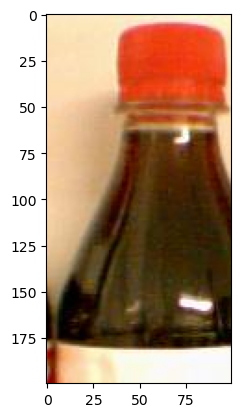

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


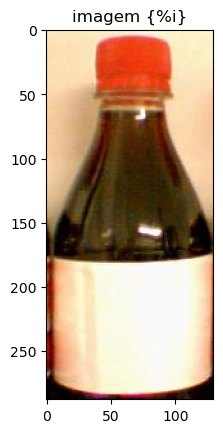

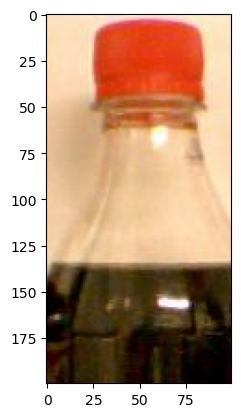

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


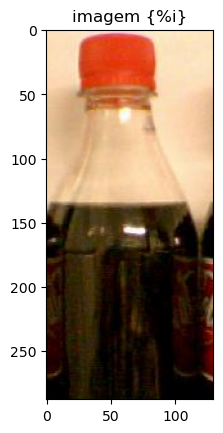

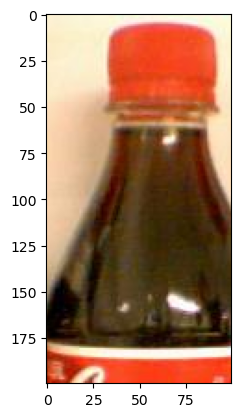

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


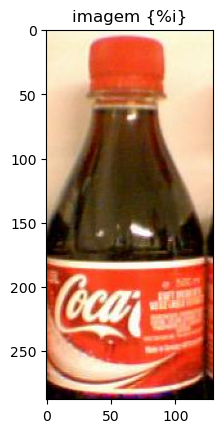

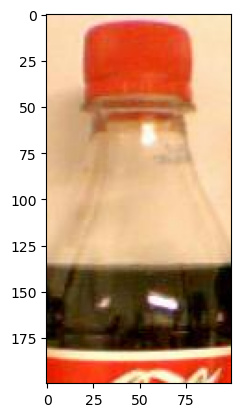

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


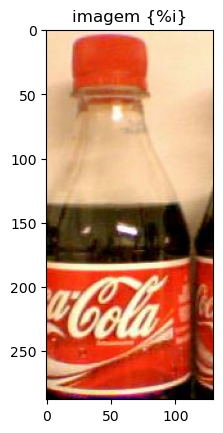

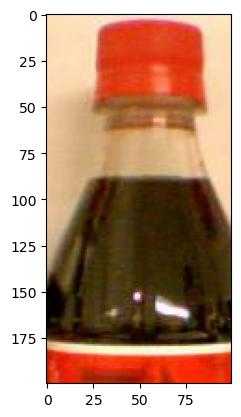

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


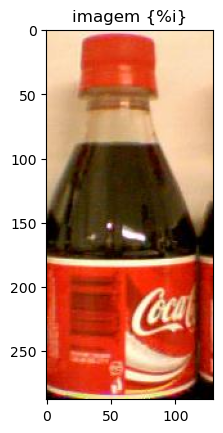

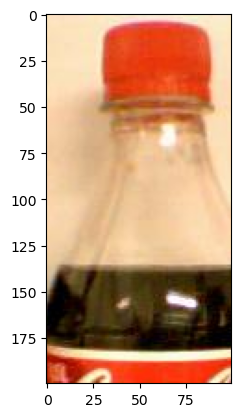

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


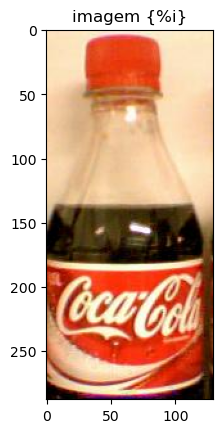

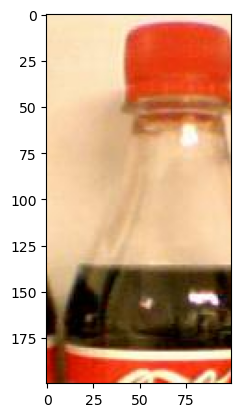

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


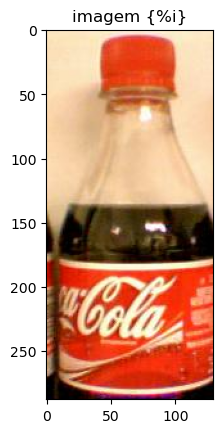

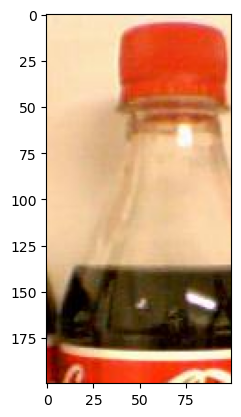

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


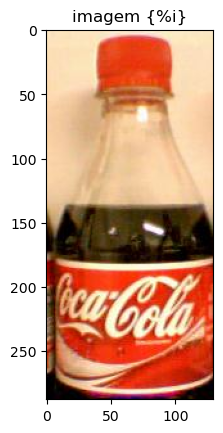

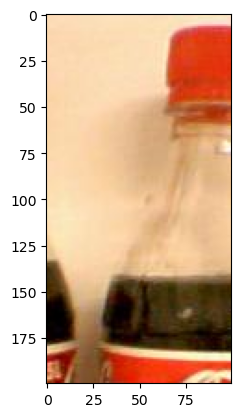

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


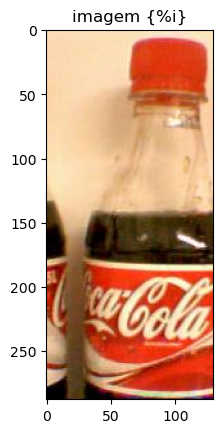

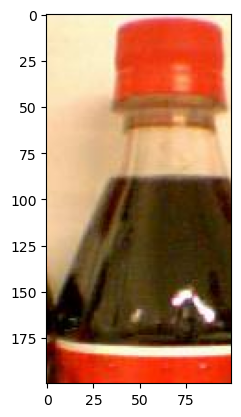

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


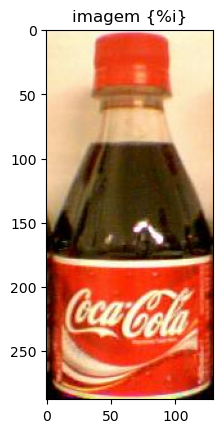

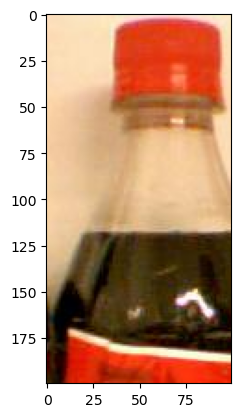

{'CONTENT_HIGH': 1, 'CONTENT_LOW': 0, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


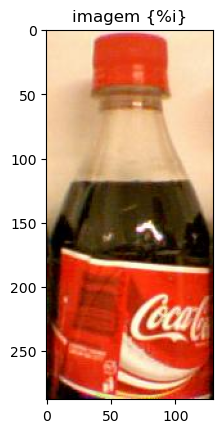

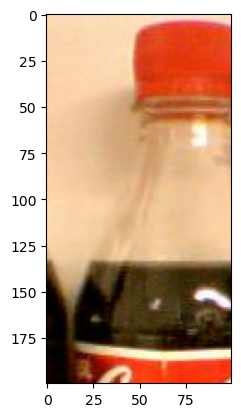

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


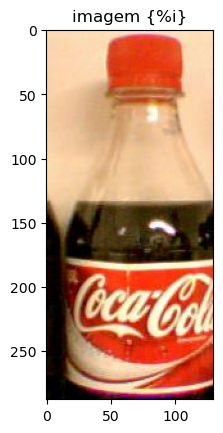

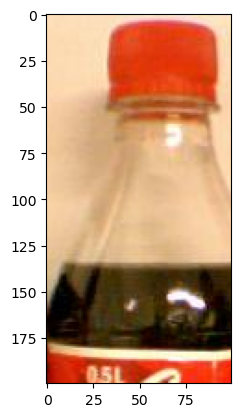

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 0, 'BOTTLE_SMASHED': 0, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 0, 'LABEL_NONE': 0, 'BOTTLE_NONE': 0}


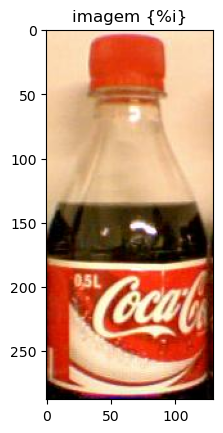

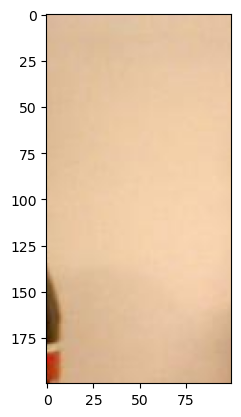

{'CONTENT_HIGH': 0, 'CONTENT_LOW': 1, 'COVER_NONE': 1, 'BOTTLE_SMASHED': 1, 'LABEL_MISPLACED': 0, 'LABEL_WHITE': 1, 'LABEL_NONE': 1, 'BOTTLE_NONE': 1}


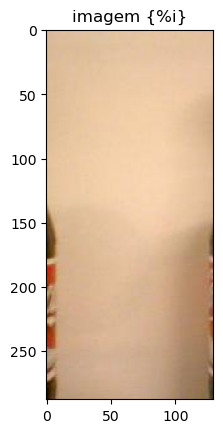

In [55]:
folder_path = 'bottles/train/'
images = load_images_from_folder(folder_path)

for i in images:    
    img = crop(i)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dic["LABEL_WHITE"] = has_label_white(img)
    dic["LABEL_NONE"] = has_label(img)
    dic["BOTTLE_NONE"] = has_bottle(img)
    dic["COVER_NONE"] = has_cap(img) 
    dic["BOTTLE_SMASHED"] = has_bottle_smashed(img)
    dic["CONTENT_HIGH"] = has_content(img)
    dic["CONTENT_LOW"] = int(not has_content(img))
    print(dic)
    img = cv2.cvtColor(img, 0)
    plt.imshow(img)
    plt.title("imagem {%i}")
    plt.show()
    